In [1]:
!pip install torch

try:
    from ultralytics import YOLO
except:
    !pip install ultralytics
    from ultralytics import YOLO

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 660.5/660.5 kB 7.4 MB/s eta 0:00:00


In [2]:
import torch
from PIL import Image
from IPython.display  import display
import zipfile
import os

In [3]:
torch.cuda.is_available()

True

In [4]:
# download the dataset
!curl -L "https://universe.roboflow.com/ds/rTSnBOdeq6?key=9TGU3dYlZ2" --output roboflow.zip; unzip roboflow.zip; rm roboflow.zip

  % Total    % Received % Xferd  Average Speed   Time    Time     Time  Current
                                 Dload  Upload   Total   Spent    Left  Speed
100   895  100   895    0     0   2874      0 --:--:-- --:--:-- --:--:--  2868
100 18.2M  100 18.2M    0     0  6846k      0  0:00:02  0:00:02 --:--:-- 12.9M
Archive:  roboflow.zip
 extracting: README.dataset.txt      
 extracting: README.roboflow.txt     
 extracting: data.yaml               
   creating: test/
   creating: test/images/
 extracting: test/images/20231009_132947_jpg.rf.3efbc254f393279eb709d352589d53a8.jpg  
 extracting: test/images/20231009_133003_jpg.rf.79f86c266a1b904fce294d14d223e36f.jpg  
 extracting: test/images/20231009_133120_jpg.rf.255f7f397f36df359c772dd179408820.jpg  
 extracting: test/images/20231009_133211_jpg.rf.2eb1b58436b0e9025a624ff2eaf61c3a.jpg  
 extracting: test/images/20231009_133237_jpg.rf.8bae0bd7a957a5b571e3a7130f0f1ce7.jpg  
 extracting: test/images/20231009_133300_jpg.rf.693e46d5198ae3b8dfc

In [5]:
yolo = YOLO('yolov8n.pt')

100%|██████████| 6.23M/6.23M [00:00<00:00, 193MB/s]


In [6]:
yolo.train(data="./data.yaml", epochs=40)

Ultralytics YOLOv8.0.227 🚀 Python-3.10.12 torch-2.1.0+cu121 CUDA:0 (Tesla T4, 15102MiB)
engine/trainer: task=detect, mode=train, model=yolov8n.pt, data=./data.yaml, epochs=40, patience=50, batch=16, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=train, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, show=False, save_frames=False, save_txt=False, save_conf=False, save_crop=False, show_labels=True, show_conf=True, show_boxes=True, line_width=None, format=torchscript, keras=Fa

100%|██████████| 755k/755k [00:00<00:00, 39.8MB/s]


Overriding model.yaml nc=80 with nc=5

                   from  n    params  module                                       arguments                     
  0                  -1  1       464  ultralytics.nn.modules.conv.Conv             [3, 16, 3, 2]                 
  1                  -1  1      4672  ultralytics.nn.modules.conv.Conv             [16, 32, 3, 2]                
  2                  -1  1      7360  ultralytics.nn.modules.block.C2f             [32, 32, 1, True]             
  3                  -1  1     18560  ultralytics.nn.modules.conv.Conv             [32, 64, 3, 2]                
  4                  -1  2     49664  ultralytics.nn.modules.block.C2f             [64, 64, 2, True]             
  5                  -1  1     73984  ultralytics.nn.modules.conv.Conv             [64, 128, 3, 2]               
  6                  -1  2    197632  ultralytics.nn.modules.block.C2f             [128, 128, 2, True]           
  7                  -1  1    295424  ultralytics

train: Scanning /content/train/labels... 382 images, 0 backgrounds, 0 corrupt: 100%|██████████| 382/382 [00:00<00:00, 1014.23it/s]


train: New cache created: /content/train/labels.cache
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01), CLAHE(p=0.01, clip_limit=(1, 4.0), tile_grid_size=(8, 8))


val: Scanning /content/valid/labels... 37 images, 1 backgrounds, 0 corrupt: 100%|██████████| 37/37 [00:00<00:00, 603.63it/s]

val: New cache created: /content/valid/labels.cache


Plotting labels to runs/detect/train/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.001111, momentum=0.9) with parameter groups 57 weight(decay=0.0), 64 weight(decay=0.0005), 63 bias(decay=0.0)
Image sizes 640 train, 640 val
Using 2 dataloader workers
Logging results to runs/detect/train
Starting training for 40 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/40      3.37G      1.606      3.558      1.106        429        640: 100%|██████████| 24/24 [00:25<00:00,  1.07s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:03<00:00,  1.83s/it]

                   all         37       1078     0.0605      0.595      0.178      0.105



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       2/40      2.93G      1.558      2.231      1.033        413        640: 100%|██████████| 24/24 [00:12<00:00,  1.88it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.14it/s]


                   all         37       1078      0.299      0.294      0.283       0.15

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/40         3G      1.457      1.791       1.02        620        640: 100%|██████████| 24/24 [00:10<00:00,  2.21it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.22it/s]

                   all         37       1078      0.263      0.376        0.3      0.173



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       4/40      3.25G      1.417      1.633      1.004        575        640: 100%|██████████| 24/24 [00:11<00:00,  2.17it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  2.00it/s]

                   all         37       1078       0.52      0.337      0.381      0.203



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       5/40      3.48G      1.408      1.517      1.009        773        640: 100%|██████████| 24/24 [00:10<00:00,  2.22it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.09it/s]


                   all         37       1078      0.297       0.37      0.353      0.201

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       6/40      3.35G      1.411       1.49      1.023        292        640: 100%|██████████| 24/24 [00:12<00:00,  1.85it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.15it/s]

                   all         37       1078      0.411      0.455      0.407      0.251



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       7/40      3.02G      1.361      1.391      1.011        561        640: 100%|██████████| 24/24 [00:09<00:00,  2.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.29it/s]

                   all         37       1078      0.413      0.459      0.461      0.287



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       8/40      2.85G      1.321      1.328     0.9964        438        640: 100%|██████████| 24/24 [00:09<00:00,  2.65it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.45it/s]

                   all         37       1078      0.454      0.537      0.519      0.324



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       9/40       3.1G      1.326      1.278     0.9973        587        640: 100%|██████████| 24/24 [00:10<00:00,  2.35it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.43it/s]

                   all         37       1078      0.441      0.503      0.521      0.306



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      10/40      3.59G      1.305      1.225     0.9893        694        640: 100%|██████████| 24/24 [00:11<00:00,  2.14it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.09it/s]

                   all         37       1078       0.49      0.528      0.524      0.305



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      11/40      3.34G      1.277      1.162     0.9834        585        640: 100%|██████████| 24/24 [00:11<00:00,  2.14it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.04it/s]

                   all         37       1078      0.602      0.528      0.564      0.338



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      12/40      3.29G      1.269      1.176     0.9938        603        640: 100%|██████████| 24/24 [00:11<00:00,  2.17it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.09it/s]

                   all         37       1078      0.519      0.555      0.543      0.345



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      13/40      3.26G      1.248      1.131     0.9799        457        640: 100%|██████████| 24/24 [00:10<00:00,  2.24it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.27it/s]

                   all         37       1078      0.694      0.596      0.673      0.419



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      14/40      3.17G      1.278      1.105     0.9886        426        640: 100%|██████████| 24/24 [00:10<00:00,  2.19it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.22it/s]

                   all         37       1078      0.668      0.633      0.678      0.437



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      15/40      3.37G      1.228      1.064     0.9779        437        640: 100%|██████████| 24/24 [00:09<00:00,  2.44it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.30it/s]

                   all         37       1078       0.78      0.636      0.714      0.472



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      16/40      3.38G       1.26      1.051     0.9837        488        640: 100%|██████████| 24/24 [00:09<00:00,  2.55it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.42it/s]

                   all         37       1078      0.705       0.55       0.61      0.402



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      17/40      3.19G      1.221      1.043     0.9752        352        640: 100%|██████████| 24/24 [00:09<00:00,  2.56it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.12it/s]

                   all         37       1078      0.718      0.697       0.73      0.468



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      18/40      2.93G      1.223      1.004     0.9797        614        640: 100%|██████████| 24/24 [00:10<00:00,  2.27it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.15it/s]

                   all         37       1078      0.722      0.622      0.693      0.433



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      19/40      2.96G      1.211     0.9586     0.9685        465        640: 100%|██████████| 24/24 [00:10<00:00,  2.22it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.30it/s]

                   all         37       1078      0.724       0.66      0.708      0.453



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      20/40      3.18G      1.208     0.9472      0.966        516        640: 100%|██████████| 24/24 [00:10<00:00,  2.19it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.91it/s]

                   all         37       1078      0.804      0.663      0.735      0.422



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      21/40      3.63G      1.267     0.9435     0.9802        468        640: 100%|██████████| 24/24 [00:10<00:00,  2.19it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.27it/s]

                   all         37       1078      0.804      0.702       0.76      0.497



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      22/40      3.89G      1.199     0.9079      0.959        587        640: 100%|██████████| 24/24 [00:10<00:00,  2.29it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.58it/s]

                   all         37       1078      0.796      0.712       0.76      0.501



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      23/40      3.14G      1.196     0.8903     0.9735        547        640: 100%|██████████| 24/24 [00:08<00:00,  2.68it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.34it/s]

                   all         37       1078      0.802      0.668      0.741      0.465



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      24/40      3.41G      1.215     0.9042     0.9733        439        640: 100%|██████████| 24/24 [00:09<00:00,  2.49it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.18it/s]

                   all         37       1078      0.767      0.688      0.748      0.465



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      25/40      3.17G      1.166     0.8672     0.9558        655        640: 100%|██████████| 24/24 [00:10<00:00,  2.22it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.35it/s]

                   all         37       1078       0.79      0.682      0.749       0.48



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      26/40      3.21G      1.175     0.8649     0.9614        583        640: 100%|██████████| 24/24 [00:11<00:00,  2.16it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.42it/s]

                   all         37       1078      0.744      0.691      0.739      0.478



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      27/40      3.07G      1.145     0.8327     0.9595        503        640: 100%|██████████| 24/24 [00:10<00:00,  2.25it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.44it/s]

                   all         37       1078      0.819      0.718      0.786      0.515



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      28/40         3G      1.149     0.8292     0.9489        674        640: 100%|██████████| 24/24 [00:10<00:00,  2.21it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.31it/s]

                   all         37       1078      0.757      0.728      0.766      0.483



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      29/40      3.14G      1.135     0.8298     0.9522        362        640: 100%|██████████| 24/24 [00:10<00:00,  2.36it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.46it/s]

                   all         37       1078      0.844      0.704      0.794       0.52



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      30/40      3.61G      1.143     0.7926     0.9518        656        640: 100%|██████████| 24/24 [00:09<00:00,  2.65it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.67it/s]

                   all         37       1078      0.835      0.698      0.776      0.469


Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01), CLAHE(p=0.01, clip_limit=(1, 4.0), tile_grid_size=(8, 8))

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      31/40      3.14G      1.136     0.8086     0.9574        352        640: 100%|██████████| 24/24 [00:18<00:00,  1.32it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.24it/s]

                   all         37       1078      0.833      0.707      0.773      0.495



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      32/40       2.8G      1.147     0.7751     0.9621        324        640: 100%|██████████| 24/24 [00:09<00:00,  2.65it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.93it/s]


                   all         37       1078      0.817      0.663      0.749      0.455

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      33/40      3.17G      1.152      0.773     0.9541        335        640: 100%|██████████| 24/24 [00:08<00:00,  2.97it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.39it/s]

                   all         37       1078      0.803      0.693      0.764      0.455



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      34/40      2.73G      1.147     0.7484     0.9637        409        640: 100%|██████████| 24/24 [00:09<00:00,  2.65it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.31it/s]

                   all         37       1078      0.818      0.713      0.773      0.502



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      35/40      2.85G      1.127     0.7529     0.9565        370        640: 100%|██████████| 24/24 [00:09<00:00,  2.51it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.38it/s]

                   all         37       1078      0.804      0.711      0.786      0.507



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      36/40      3.24G      1.115     0.7292     0.9525        385        640: 100%|██████████| 24/24 [00:09<00:00,  2.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.71it/s]

                   all         37       1078      0.839      0.714      0.789      0.522



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      37/40      2.96G      1.118     0.7228     0.9542        407        640: 100%|██████████| 24/24 [00:08<00:00,  2.92it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.17it/s]

                   all         37       1078      0.836      0.721      0.783      0.496



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      38/40      3.37G      1.098     0.7136     0.9522        398        640: 100%|██████████| 24/24 [00:08<00:00,  2.69it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.40it/s]

                   all         37       1078      0.841      0.712      0.792      0.524



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      39/40      2.68G      1.103     0.7157     0.9496        356        640: 100%|██████████| 24/24 [00:09<00:00,  2.50it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.30it/s]

                   all         37       1078      0.864      0.693      0.785      0.501



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      40/40      3.16G      1.086     0.7056      0.945        390        640: 100%|██████████| 24/24 [00:09<00:00,  2.60it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.87it/s]

                   all         37       1078      0.858      0.714      0.793      0.524



40 epochs completed in 0.144 hours.
Optimizer stripped from runs/detect/train/weights/last.pt, 6.3MB
Optimizer stripped from runs/detect/train/weights/best.pt, 6.3MB

Validating runs/detect/train/weights/best.pt...
Ultralytics YOLOv8.0.227 🚀 Python-3.10.12 torch-2.1.0+cu121 CUDA:0 (Tesla T4, 15102MiB)
Model summary (fused): 168 layers, 3006623 parameters, 0 gradients, 8.1 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.58it/s]


                   all         37       1078      0.856      0.713      0.793      0.525
                 Crimp         37        377      0.825      0.724      0.791      0.497
                   Jug         37        284      0.883       0.82      0.888      0.618
                 Pinch         37        145      0.873        0.6      0.725      0.405
                Pocket         37         46      0.928      0.717       0.79      0.521
                Sloper         37        226      0.773      0.704      0.772      0.582
Speed: 0.2ms preprocess, 4.0ms inference, 0.0ms loss, 4.2ms postprocess per image
Results saved to runs/detect/train


ultralytics.utils.metrics.DetMetrics object with attributes:

ap_class_index: array([0, 1, 2, 3, 4])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x795141f7f430>
curves: ['Precision-Recall(B)', 'F1-Confidence(B)', 'Precision-Confidence(B)', 'Recall-Confidence(B)']
curves_results: [[array([          0,    0.001001,    0.002002,    0.003003,    0.004004,    0.005005,    0.006006,    0.007007,    0.008008,    0.009009,     0.01001,    0.011011,    0.012012,    0.013013,    0.014014,    0.015015,    0.016016,    0.017017,    0.018018,    0.019019,     0.02002,    0.021021,    0.022022,    0.023023,
          0.024024,    0.025025,    0.026026,    0.027027,    0.028028,    0.029029,     0.03003,    0.031031,    0.032032,    0.033033,    0.034034,    0.035035,    0.036036,    0.037037,    0.038038,    0.039039,     0.04004,    0.041041,    0.042042,    0.043043,    0.044044,    0.045045,    0.046046,    0.047047,
        


image 1/1 /content/test/images/20231016_174531_jpg.rf.9d1c944ca270dc8c1cd248aa0b2befaa.jpg: 640x640 12 Crimps, 5 Jugs, 3 Pinchs, 4 Slopers, 7.4ms
Speed: 1.6ms preprocess, 7.4ms inference, 2.2ms postprocess per image at shape (1, 3, 640, 640)


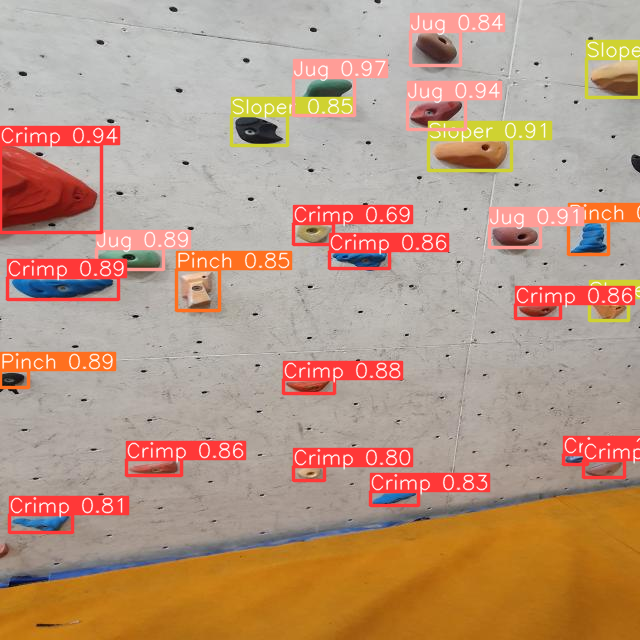

In [7]:
def run_yolo(yolo, image_url, conf=0.25, iou=0.7):
    results = yolo(image_url, conf=conf, iou=iou)
    res = results[0].plot()[:, :, [2,1,0]]
    return Image.fromarray(res)

yolo = YOLO('./runs/detect/train/weights/best.pt')

image_url = './test/images/20231016_174531_jpg.rf.9d1c944ca270dc8c1cd248aa0b2befaa.jpg'

run_yolo(yolo, image_url)

In [8]:
#manually downloaded the zipfile from roboflow


zip_file_path = 'yolo_bound.zip'


extracted_dir = 'bound_data'

os.makedirs(extracted_dir, exist_ok=True)

In [9]:
with zipfile.ZipFile(zip_file_path, 'r') as zip_ref:
    zip_ref.extractall(extracted_dir)

In [10]:
path="./bound_data/test/images"


image 1/1 /content/bound_data/test/images/IMG_2772_jpg.rf.11d41de6052b14c76c7a35a1daa7556d.jpg: 480x640 11 Crimps, 10 Jugs, 1 Pinch, 38 Slopers, 66.6ms
Speed: 3.8ms preprocess, 66.6ms inference, 2.2ms postprocess per image at shape (1, 3, 480, 640)


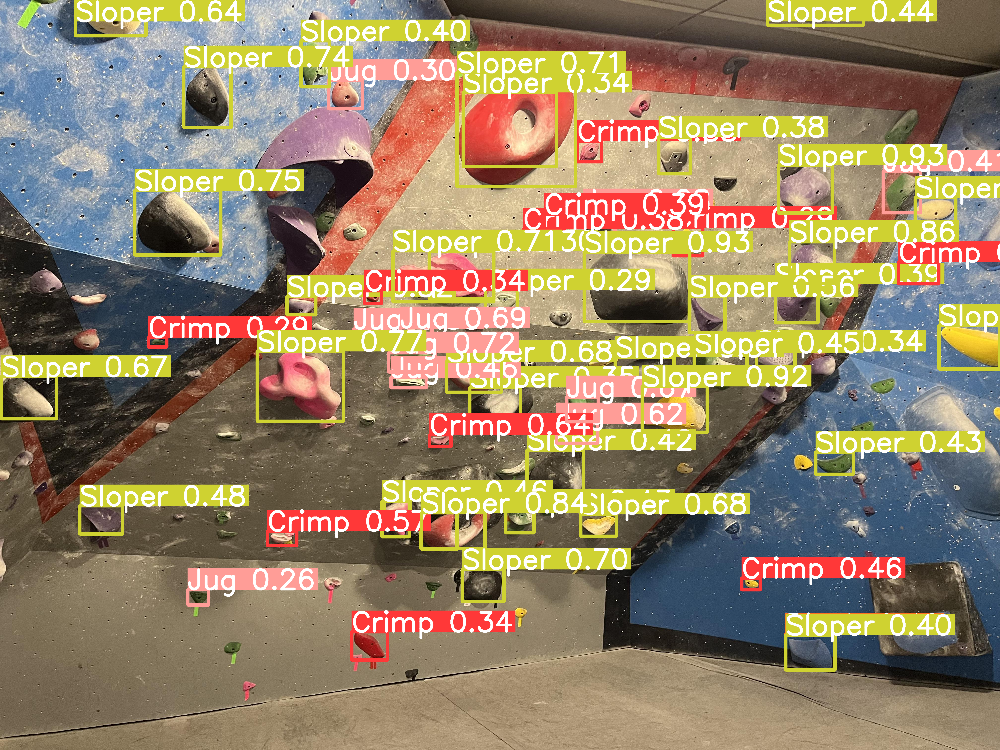

In [11]:
for item in os.listdir(path):
    picture = path + "/" + item
    results = yolo(picture, conf=0.25, iou=0.7)
    res = results[0].plot()[:, :, [2,1,0]]
    display(Image.fromarray(res))
    break

In [ ]:
# %load_ext tensorboard
# %tensorboard --logdir runs

Evaluating model performance on out of sample data

In [12]:
class BoundingBox:
    def __init__(self, left, top, right, bottom):
        self.left = left
        self.top = top
        self.right = right
        self.bottom = bottom

In [13]:
def convert_gt_to_xyxy(gt_box):
    x1 = min(gt_box[0], gt_box[2], gt_box[4], gt_box[6])
    y1 = min(gt_box[1], gt_box[3], gt_box[5], gt_box[7])
    x2 = max(gt_box[0], gt_box[2], gt_box[4], gt_box[6])
    y2 = max(gt_box[1], gt_box[3], gt_box[5], gt_box[7])
    return x1, y1, x2, y2

In [14]:
def calculate_iou(box1, box2):
    box2=convert_gt_to_xyxy(box2)
    box2 = BoundingBox(box2[0], box2[1], box2[2], box2[3])
    box1 = BoundingBox(box1[0], box1[1], box1[2], box1[3])


    intersection_width = min(box1.right, box2.right) - max(box1.left, box2.left)
    intersection_height = min(box1.bottom, box2.bottom) - max(box1.top, box2.top)

    if intersection_width <= 0 or intersection_height <= 0:
        return 0

    intersection_area = intersection_width * intersection_height

    box1_area = (box1.right - box1.left) * (box1.bottom - box1.top)
    box2_area = (box2.right - box2.left) * (box2.bottom - box2.top)

    union_area = box1_area + box2_area - intersection_area

    iou = intersection_area / union_area
    return iou

In [15]:
def convert_to_truth(text_input):
  lines = text_input.split('\n')

  bounding_boxes_and_labels = []

  for line in lines:
      if line.strip():
          parts = line.split()
          box = tuple(map(float, parts[:8]))
          label = parts[8]
          confidence = float(parts[9])
          bounding_boxes_and_labels.append({"box": box, "label": label, "confidence": confidence})
  return bounding_boxes_and_labels

In [16]:
def calculate_precision_recall(ground_truth_data, results, iou_threshold=0.5):
    true_positives = 0
    false_positives = 0
    false_negatives = 0

    results_boxes = results[0].boxes.data.tolist()
    results_labels = [results[0].names[int(each_score[-1])] for each_score in results_boxes]

    for result in zip(results_boxes, results_labels):
        pred_box, pred_label = result
        pred_box = pred_box[:4]

        match_found = False

        for gt_data in ground_truth_data:
            gt_box = gt_data["box"]
            gt_label = gt_data["label"]

            if pred_label == gt_label and calculate_iou(pred_box, gt_box) > iou_threshold:
                match_found = True
                break

        if match_found:
            true_positives += 1
        else:
            false_positives += 1

    false_negatives = len(ground_truth_data) - true_positives

    precision = true_positives / (true_positives + false_positives) if (true_positives + false_positives) > 0 else 0
    recall = true_positives / (true_positives + false_negatives) if (true_positives + false_negatives) > 0 else 0

    return precision, recall

In [17]:
img_iterator, img_path = os.listdir("/content/bound_data/test/images"), "/content/bound_data/test/images"
label_path = "/content/bound_data/test/labelTxt"

total_precision, total_recall = 0, 0
for i in range(len(img_iterator)):

  label=label_path+"/"+img_iterator[i][:-3]+"txt"

  with open(label) as f:
    og_labels=f.read()

  ground_truth=convert_to_truth(og_labels)


  image_path=img_path+"/"+img_iterator[i]

  results = yolo(image_path, conf=0.25, iou=0.7)

  total_precision+=calculate_precision_recall(ground_truth, results)[0]
  total_recall+=calculate_precision_recall(ground_truth, results)[1]


image 1/1 /content/bound_data/test/images/IMG_2772_jpg.rf.11d41de6052b14c76c7a35a1daa7556d.jpg: 480x640 11 Crimps, 10 Jugs, 1 Pinch, 38 Slopers, 12.7ms
Speed: 3.9ms preprocess, 12.7ms inference, 2.9ms postprocess per image at shape (1, 3, 480, 640)

image 1/1 /content/bound_data/test/images/IMG_2727_jpg.rf.06271d1bcc0da6e4e5ca27aeac72a51f.jpg: 480x640 11 Crimps, 13 Jugs, 4 Pinchs, 38 Slopers, 13.6ms
Speed: 7.9ms preprocess, 13.6ms inference, 5.9ms postprocess per image at shape (1, 3, 480, 640)

image 1/1 /content/bound_data/test/images/IMG_2769_jpg.rf.e4f77c0c7c26572c08b66f749592ca5c.jpg: 480x640 8 Crimps, 3 Jugs, 6 Pinchs, 1 Pocket, 38 Slopers, 12.7ms
Speed: 7.0ms preprocess, 12.7ms inference, 2.6ms postprocess per image at shape (1, 3, 480, 640)

image 1/1 /content/bound_data/test/images/IMG_2773_jpg.rf.36ad78f5be9622a22801c22beb8aa1ac.jpg: 480x640 8 Crimps, 9 Jugs, 1 Pinch, 3 Pockets, 19 Slopers, 10.0ms
Speed: 4.2ms preprocess, 10.0ms inference, 2.5ms postprocess per image at shap

In [18]:
f"The precision is: {total_precision/12}, the recall is: {total_recall/12} "

'The precision is: 0.10953917539796289, the recall is: 0.1381708785773421 '

In [20]:
f"F1 Score is:{2*(total_recall/12*total_precision/12)/(total_recall/12+total_precision/12)}"

'F1 Score is:0.12220032138770578'